In [1]:
!nvidia-smi

Sat Sep 16 03:13:38 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    26W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!wget https://zenodo.org/record/5205674/files/dset-s2.zip

--2023-09-16 03:13:38--  https://zenodo.org/record/5205674/files/dset-s2.zip
Resolving zenodo.org (zenodo.org)... 188.185.124.72
Connecting to zenodo.org (zenodo.org)|188.185.124.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 611792578 (583M) [application/octet-stream]
Saving to: ‘dset-s2.zip’

dset-s2.zip         100%[===================>] 583.45M  7.81MB/s    in 7m 2s   

2023-09-16 03:20:43 (1.38 MB/s) - ‘dset-s2.zip’ saved [611792578/611792578]



In [3]:
!unzip dset-s2.zip

Archive:  dset-s2.zip
   creating: dset-s2/
  inflating: __MACOSX/._dset-s2      
   creating: dset-s2/tra_truth/
   creating: dset-s2/val_truth/
   creating: dset-s2/tra_scene/
   creating: dset-s2/val_scene/
  inflating: dset-s2/tra_truth/S2A_L2A_20190817_N0213_R089_S1_Truth.tif  
  inflating: dset-s2/tra_truth/S2B_L2A_20190818_N0213_R035_S1_Truth.tif  
  inflating: dset-s2/tra_truth/S2A_L2A_20190716_N0213_R063_S3_Truth.tif  
  inflating: dset-s2/tra_truth/S2A_L2A_20190314_N0211_R008_S1_Truth.tif  
  inflating: dset-s2/tra_truth/S2B_L2A_20190807_N0213_R018_S2_Truth.tif  
  inflating: dset-s2/tra_truth/S2B_L2A_20190904_N0213_R132_S2_Truth.tif  
  inflating: dset-s2/tra_truth/S2A_L2A_20190811_N0213_R013_S2_Truth.tif  
  inflating: dset-s2/tra_truth/S2B_L2A_20190506_N0212_R126_S3_Truth.tif  
  inflating: dset-s2/tra_truth/S2A_L2A_20190206_N0211_R067_S1_Truth.tif  
  inflating: dset-s2/tra_truth/S2A_L2A_20190125_N0211_R034_S1_Truth.tif  
  inflating: dset-s2/tra_truth/S2B_L2A_20191023_N0

In [4]:
%pip install rasterio geopandas albumentations -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 67.1 MB/s eta 0:00:00


In [5]:
import logging
# 这一行是为了避免Rasterio的警告被打印在屏幕上
# 解决方法博客:https://stackoverflow.com/questions/74089170/suppress-rasterio-warning-warning-1-tiffreaddirectory
logger = logging.getLogger("rasterio")
logger.setLevel(logging.ERROR)

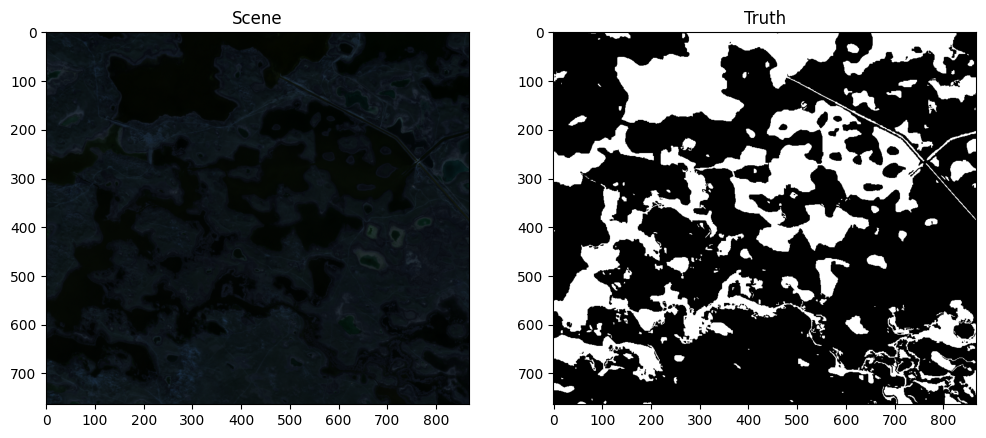

In [6]:
import os
import torch
from torch.utils.data import Dataset
import rasterio
import matplotlib.pyplot as plt
import os
import pandas as pd

scene_dir = "dset-s2/tra_scene"
truth_dir = "dset-s2/tra_truth"

scene_files = sorted([os.path.join(scene_dir, f) for f in os.listdir(scene_dir)])
truth_files = sorted([os.path.join(truth_dir, f) for f in os.listdir(truth_dir)])

pd.DataFrame({"scene_file": scene_files}).to_csv("scene_files.csv", index=False)
pd.DataFrame({"truth_file": truth_files}).to_csv("truth_files.csv", index=False)


class WaterBodyDataset(Dataset):
    def __init__(self, scene_csv, truth_csv, transform=None):
        self.transform = transform

        # 从CSV文件中读取路径
        self.scene_files = pd.read_csv(scene_csv)["scene_file"].tolist()
        self.truth_files = pd.read_csv(truth_csv)["truth_file"].tolist()

    def __len__(self):
        return len(self.scene_files)

    def __getitem__(self, idx):
        scene_path = self.scene_files[idx]
        truth_path = self.truth_files[idx]

        try:
            with rasterio.open(scene_path) as src:
                scene = src.read().transpose((1, 2, 0))  # Change the channels from (C, H, W) to (H, W, C)

            with rasterio.open(truth_path) as src:
                truth = src.read(1)
        except Exception as e:
            raise RuntimeError(f"Error reading file at index {idx}: {e}")

        sample = {'scene': scene, 'truth': truth}

        if self.transform:
            augmented = self.transform(image=scene, mask=truth)  # Pass data to the albumentations transform
            sample['scene'] = augmented['image']
            sample['truth'] = augmented['mask']

        return sample


# 创建数据集实例并指定正确的路径
scene_csv = "scene_files.csv"
truth_csv = "truth_files.csv"
dataset = WaterBodyDataset(scene_csv=scene_csv, truth_csv=truth_csv)

# 可视化第一个样本的scene和truth
sample = dataset[0]
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(sample['scene'][:, :, :3]* 0.0001 ) # 只显示前三个通道
ax[0].set_title('Scene')
ax[1].imshow(sample['truth'], cmap='gray')
ax[1].set_title('Truth')
plt.show()

In [7]:
from albumentations import (
    HorizontalFlip, VerticalFlip, RandomRotate90, Transpose, Normalize,
    Compose, ShiftScaleRotate, Resize
)
import albumentations.pytorch as A

def get_training_augmentation():
    train_transform = [
        Resize(height=256, width=256, always_apply=True),
        HorizontalFlip(p=0.5),
        VerticalFlip(p=0.5),
        RandomRotate90(p=0.5),
        Transpose(p=0.5),
        ShiftScaleRotate(shift_limit=0.01, scale_limit=0.04, rotate_limit=15, p=0.5),
        Normalize(mean=(0.485, 0.456, 0.406, 0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225, 0.229, 0.224, 0.225)),
    ]
    return Compose(train_transform)

def get_preprocessing():
    _transform = [
        Resize(height=256, width=256, always_apply=True),
        Normalize(mean=(0.485, 0.456, 0.406, 0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225, 0.229, 0.224, 0.225)),
        A.ToTensorV2(),
    ]
    return Compose(_transform)

In [8]:
from torch.utils.data import DataLoader

train_dataset = WaterBodyDataset(scene_csv="scene_files.csv", truth_csv="truth_files.csv", transform=get_training_augmentation())
valid_dataset = WaterBodyDataset(scene_csv="scene_files.csv", truth_csv="truth_files.csv", transform=get_preprocessing())

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)

In [9]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        # 编码器 (下采样)
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # 最底层
        self.bottleneck = self.conv_block(512, 1024)

        # 解码器 (上采样)
        self.upconv4 = self.upconv_block(1024 + 512, 512)
        self.upconv3 = self.upconv_block(512 + 256, 256)
        self.upconv2 = self.upconv_block(256 + 128, 128)
        self.upconv1 = self.upconv_block(128 + 64, 64)

        # 最终输出层
        self.out_conv = nn.Conv2d(64, out_channels, kernel_size=1)

        # 实例化 pooling 和 upsampling 层
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.up_sample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dropout = nn.Dropout(p=0.5) # 添加dropout层，p是dropout的概率


    def forward(self, x):
        # 编码器
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        # 底层
        bottleneck = self.bottleneck(self.pool(enc4))

        # 解码器
        upconv4 = self.upconv4(torch.cat((enc4, self.up_sample(bottleneck)), 1))
        upconv3 = self.upconv3(torch.cat((enc3, self.up_sample(upconv4)), 1))
        upconv2 = self.upconv2(torch.cat((enc2, self.up_sample(upconv3)), 1))
        upconv1 = self.upconv1(torch.cat((enc1, self.up_sample(upconv2)), 1))

        # 输出层
        return torch.sigmoid(self.out_conv(self.dropout(upconv1)))  # 将dropout应用于最终的特征图


    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

In [10]:
import torch
import torch.nn as nn

class DeepLabV3(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DeepLabV3, self).__init__()

        # 定义一些常用的操作
        def conv3x3(in_planes, out_planes, stride=1, dilation=1):
            """3x3 convolution with padding"""
            return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                             padding=dilation, dilation=dilation, bias=False)

        def conv1x1(in_planes, out_planes, stride=1):
            """1x1 convolution"""
            return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)

        # 定义残差块
        class BasicBlock(nn.Module):
            expansion = 1
            def __init__(self, inplanes, planes, stride=1, downsample=None, dilation=1):
                super(BasicBlock, self).__init__()
                self.conv1 = conv3x3(inplanes, planes, stride, dilation=dilation)
                self.bn1 = nn.BatchNorm2d(planes)
                self.relu = nn.ReLU(inplace=True)
                self.conv2 = conv3x3(planes, planes, dilation=dilation)
                self.bn2 = nn.BatchNorm2d(planes)
                self.downsample = downsample
                self.stride = stride

            def forward(self, x):
                identity = x

                out = self.conv1(x)
                out = self.bn1(out)
                out = self.relu(out)

                out = self.conv2(out)
                out = self.bn2(out)

                if self.downsample is not None:
                    identity = self.downsample(x)

                out += identity
                out = self.relu(out)

                return out

        # 定义编码器部分
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            BasicBlock(64, 64),
            BasicBlock(64, 64),
            BasicBlock(64, 128, stride=2, downsample=nn.Sequential(conv1x1(64, 128, 2), nn.BatchNorm2d(128))),
            BasicBlock(128, 128),
            BasicBlock(128, 256, stride=2, downsample=nn.Sequential(conv1x1(128, 256, 2), nn.BatchNorm2d(256))),
            BasicBlock(256, 256),
        )

        # 定义ASPP模块
        self.aspp = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, dilation=6, padding=6, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, dilation=12, padding=12, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, dilation=18, padding=18, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, out_channels, kernel_size=1, bias=False),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.aspp(x)
        return x


In [11]:
def visualize_batch(inputs, labels, outputs, batch_idx):
    # 将输入数据、标签和输出转换为可以可视化的格式
    img = inputs[batch_idx].cpu().numpy().transpose((1, 2, 0))[:,:,:3]  # 只取前3个通道来表示RGB
    lbl = labels[batch_idx].cpu().numpy()[0, :, :]   # 从标签中删除一个无效的维度
    out = outputs[batch_idx].cpu().numpy()[0, :, :]  # 从输出中删除一个无效的维度



    # 创建一个新的matplotlib图像
    plt.figure(figsize=(12, 4))

    # 显示输入图像
    plt.subplot(1, 3, 1)
    img = img * 0.01  # 降低亮度
    plt.imshow(np.clip(img, 0, 1))  # 保证图像数据在正确的范围内
    plt.title('Image')

    # 显示真值标签
    plt.subplot(1, 3, 2)
    plt.imshow(lbl, cmap='gray')
    plt.title('Ground Truth')

    # 显示网络输出
    plt.subplot(1, 3, 3)
    plt.imshow(out, cmap='gray')
    plt.title('Prediction')

    # 显示图像
    plt.show()

Epoch 1, Loss: 0.8105618059635162


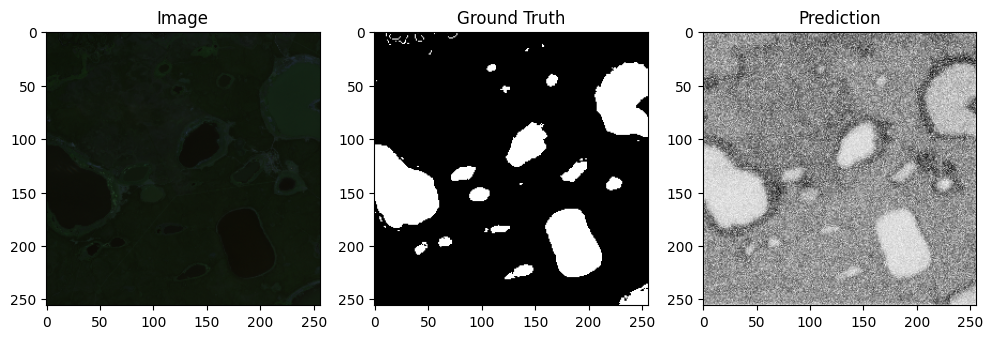

Validation IoU Score: 0.26898739817835055
Saved best model with IoU score: 0.26898739817835055
Epoch 2, Loss: 0.6871983408927917


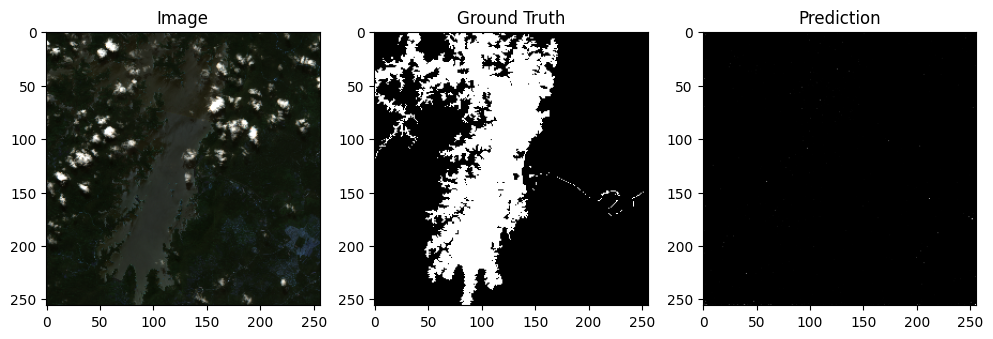

Validation IoU Score: 0.5732113113730604
Saved best model with IoU score: 0.5732113113730604
Epoch 3, Loss: 0.6833071112632751


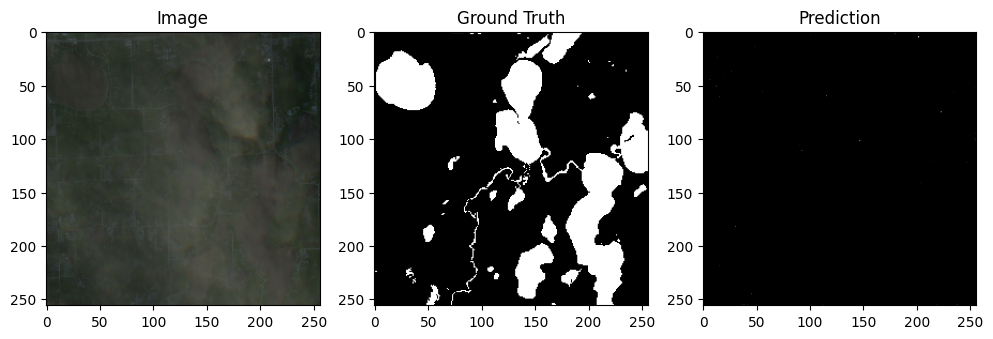

Validation IoU Score: 0.4016223208854234
Epoch 4, Loss: 0.6728384792804718


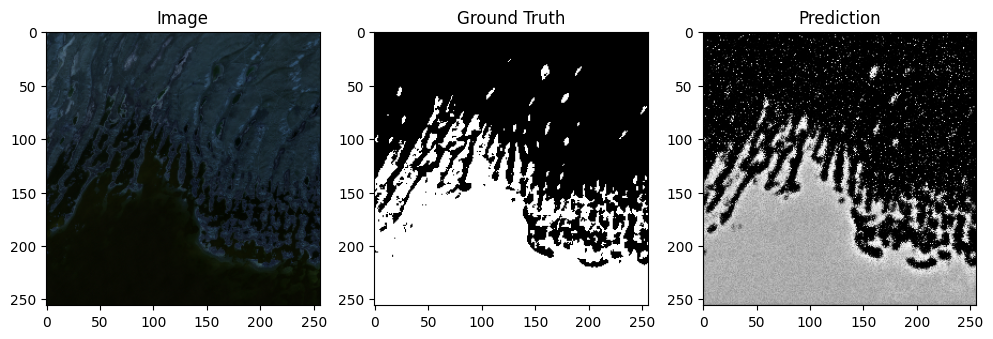

Validation IoU Score: 0.5482256532577591
Epoch 5, Loss: 0.6634066998958588


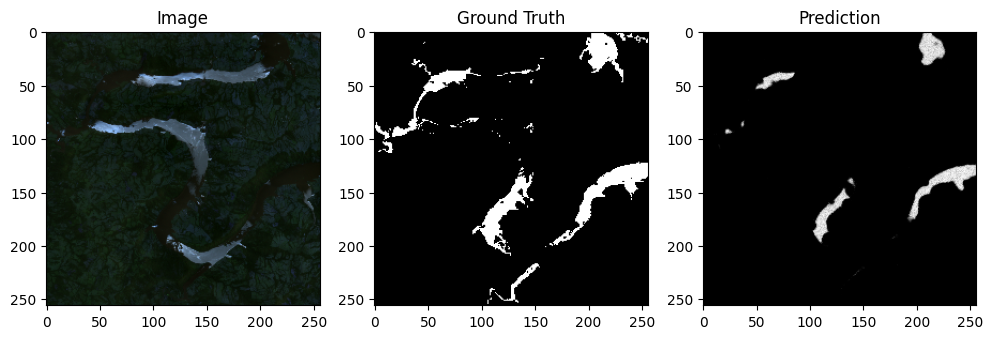

Validation IoU Score: 0.7115965815278033
Saved best model with IoU score: 0.7115965815278033
Epoch 6, Loss: 0.6516796946525574


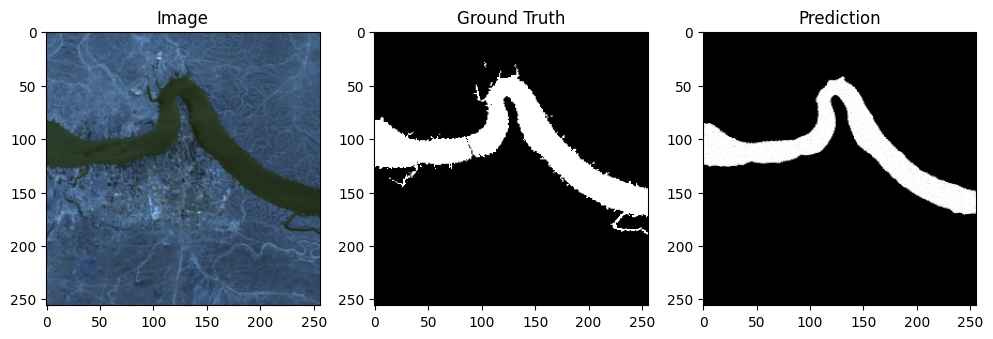

Validation IoU Score: 0.5598562273373825
Epoch 7, Loss: 0.6479564309120178


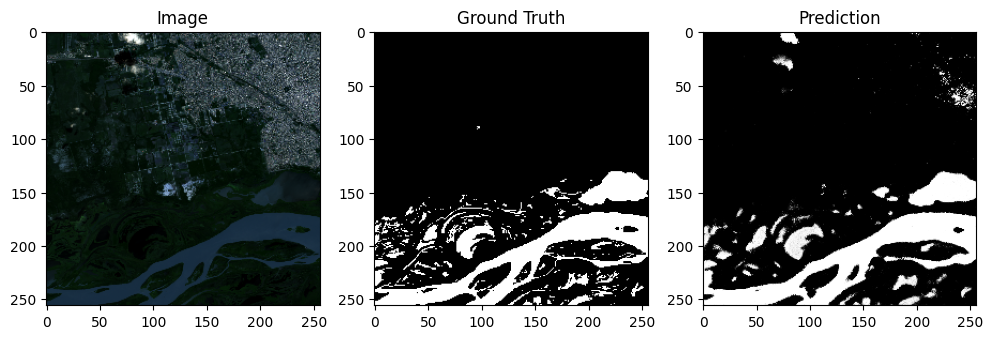

Validation IoU Score: 0.6865261007989427
Epoch 8, Loss: 0.6390997767448425


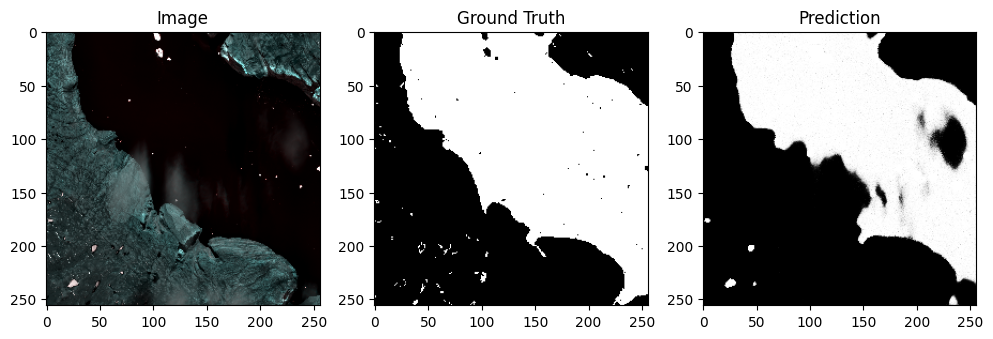

Validation IoU Score: 0.7612066285891906
Saved best model with IoU score: 0.7612066285891906
Epoch 9, Loss: 0.6432367563247681


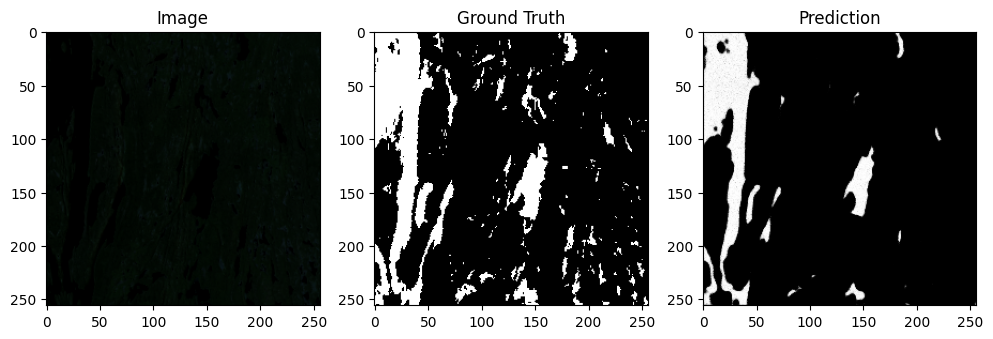

Validation IoU Score: 0.7557420590006493
Epoch 10, Loss: 0.6394486427307129


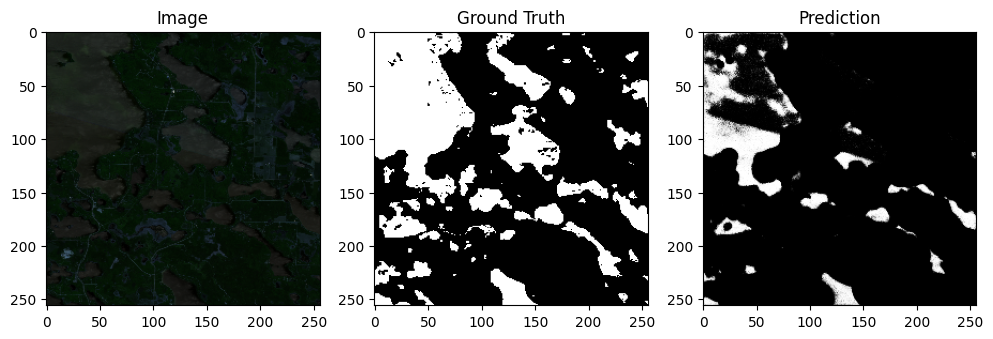

Validation IoU Score: 0.7793369380861952
Saved best model with IoU score: 0.7793369380861952
Epoch 11, Loss: 0.6355205774307251


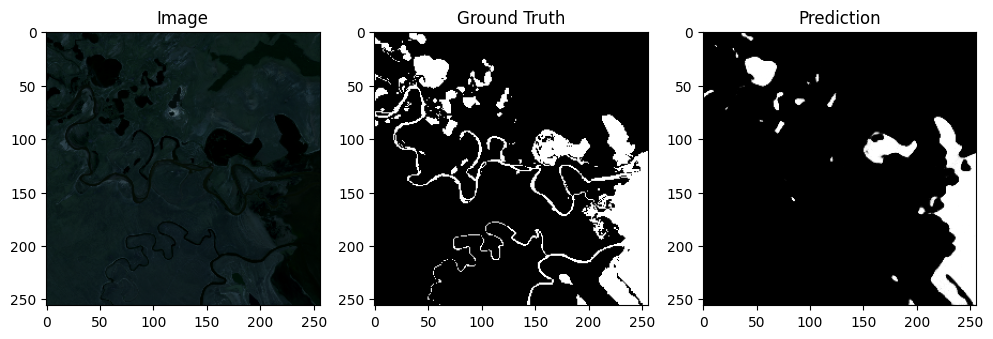

Validation IoU Score: 0.7875378786456436
Saved best model with IoU score: 0.7875378786456436
Epoch 12, Loss: 0.634772777557373


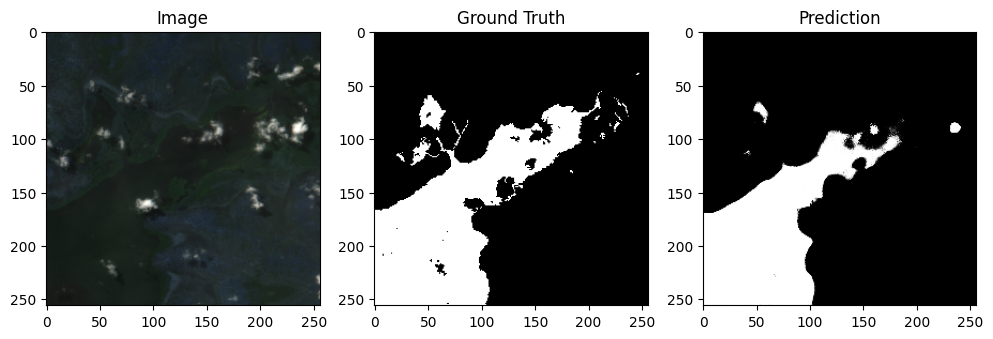

Validation IoU Score: 0.7802013453330691
Epoch 13, Loss: 0.6346070170402527


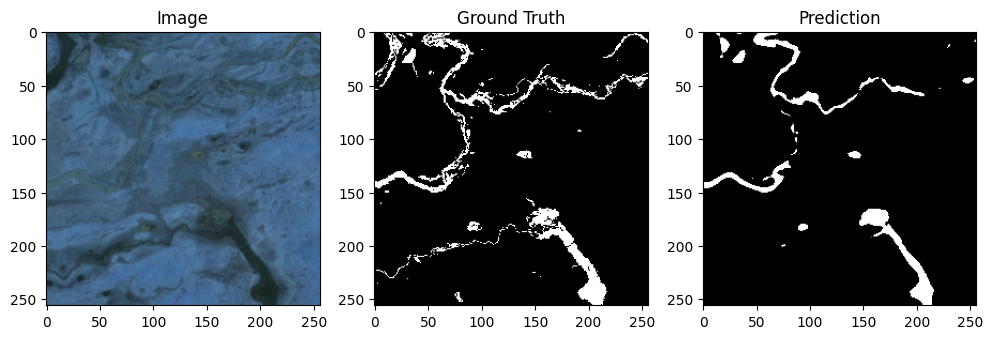

Validation IoU Score: 0.7789591367888009
Epoch 14, Loss: 0.634110152721405


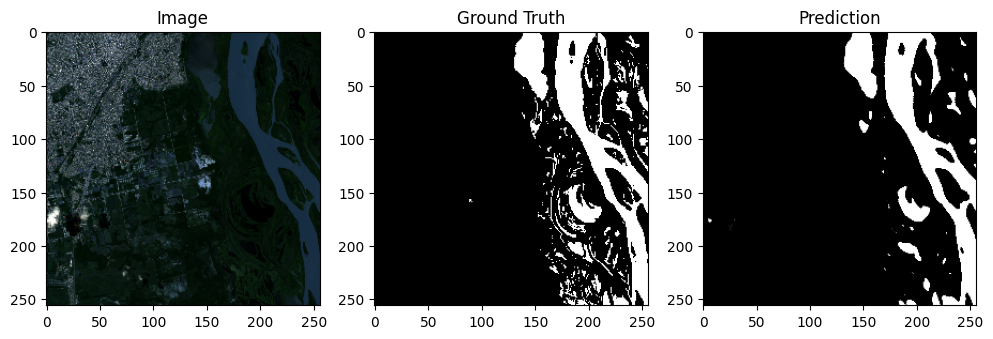

Validation IoU Score: 0.7879826211797708
Saved best model with IoU score: 0.7879826211797708
Epoch 15, Loss: 0.6324957311153412


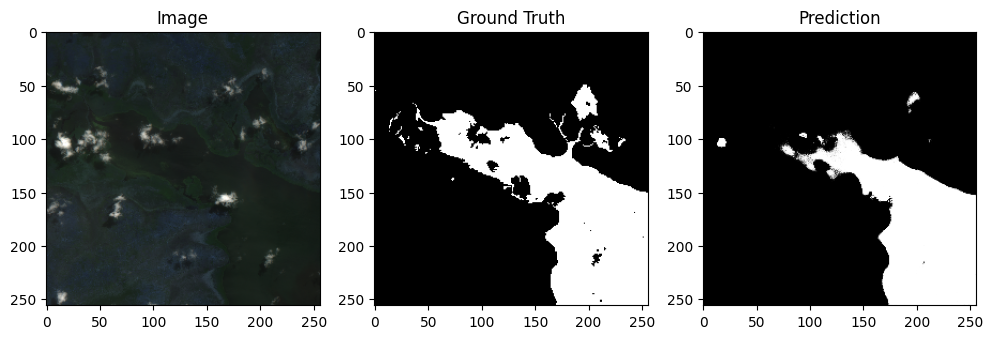

Validation IoU Score: 0.7948799278028096
Saved best model with IoU score: 0.7948799278028096
Epoch 16, Loss: 0.6316714286804199


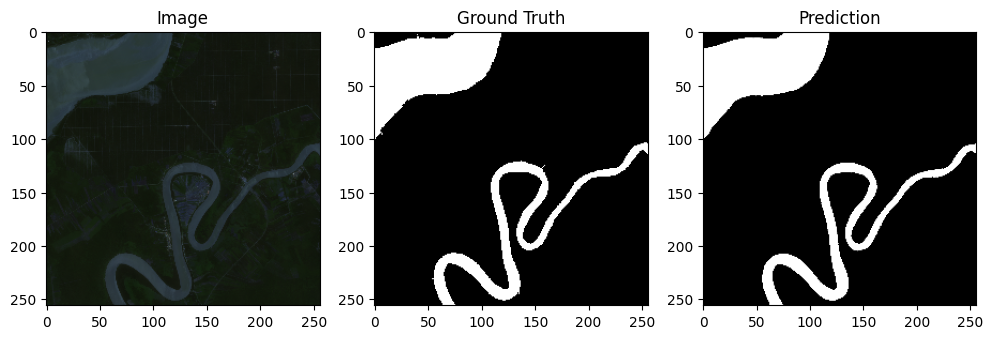

Validation IoU Score: 0.7934358838350352
Epoch 17, Loss: 0.6318898797035217


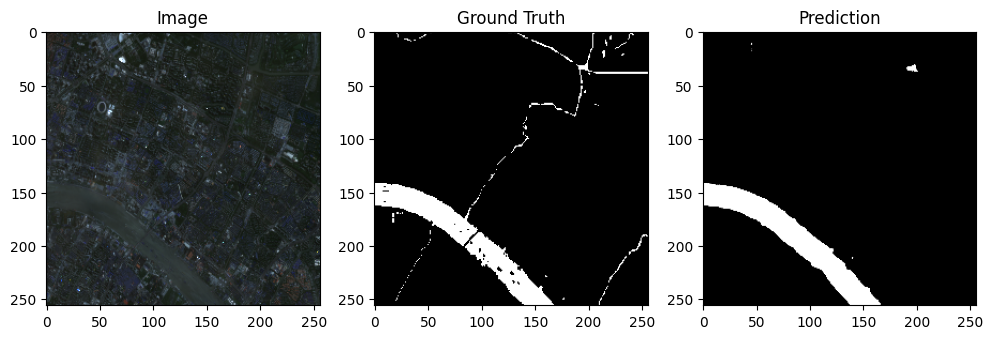

Validation IoU Score: 0.7952061621359465
Saved best model with IoU score: 0.7952061621359465
Epoch 18, Loss: 0.6312671303749084


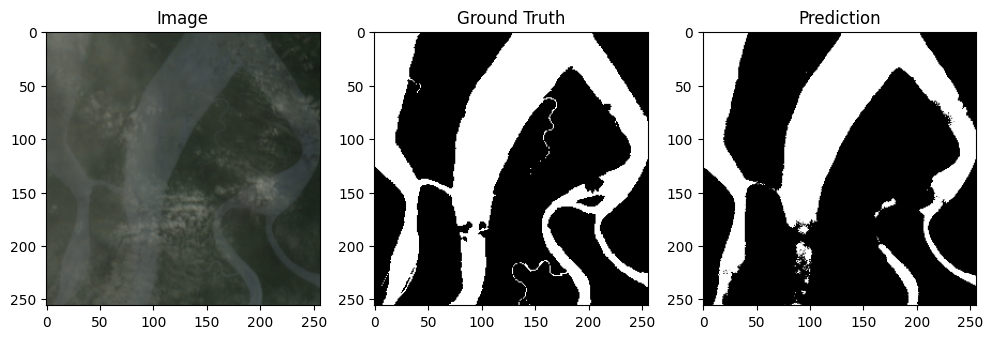

Validation IoU Score: 0.7916676057912583
Epoch 19, Loss: 0.632135272026062


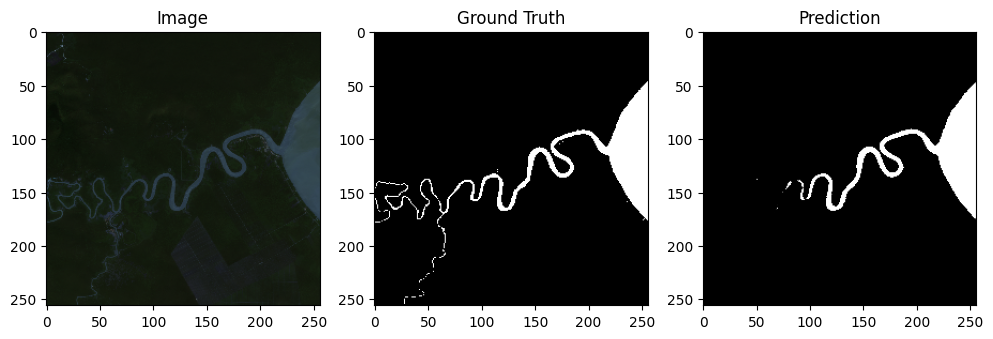

Validation IoU Score: 0.7950481404972117
Epoch 20, Loss: 0.6307317316532135


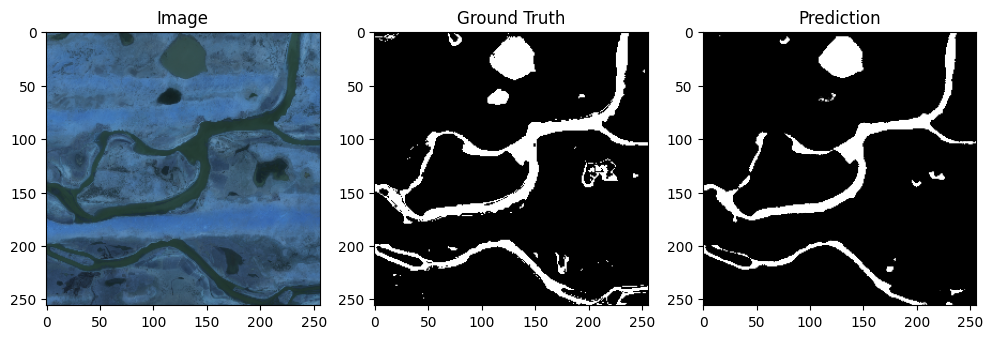

Validation IoU Score: 0.7994058180625345
Saved best model with IoU score: 0.7994058180625345
Epoch 21, Loss: 0.6303025484085083


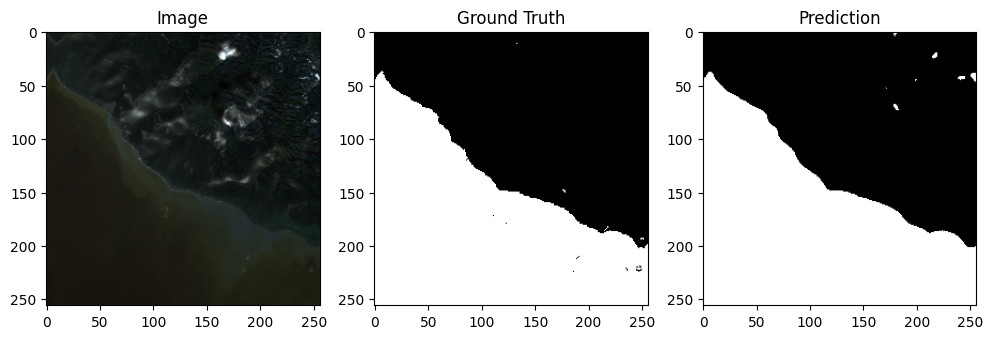

Validation IoU Score: 0.8036340452661779
Saved best model with IoU score: 0.8036340452661779
Epoch 22, Loss: 0.6303663551807404


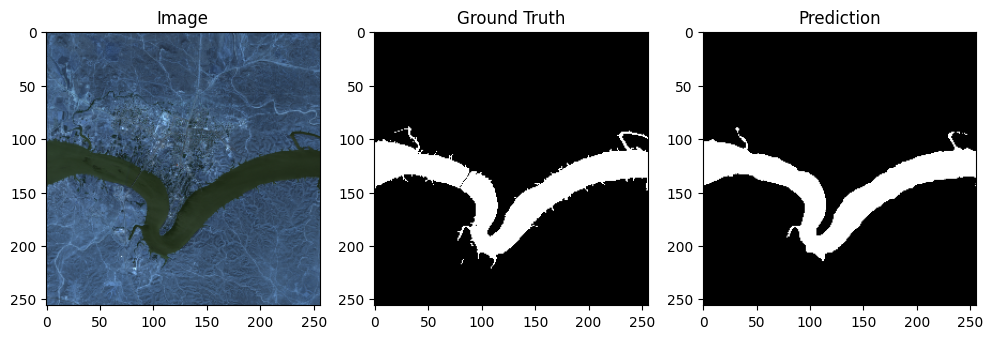

Validation IoU Score: 0.8036357182002747
Saved best model with IoU score: 0.8036357182002747
Epoch 23, Loss: 0.6298810839653015


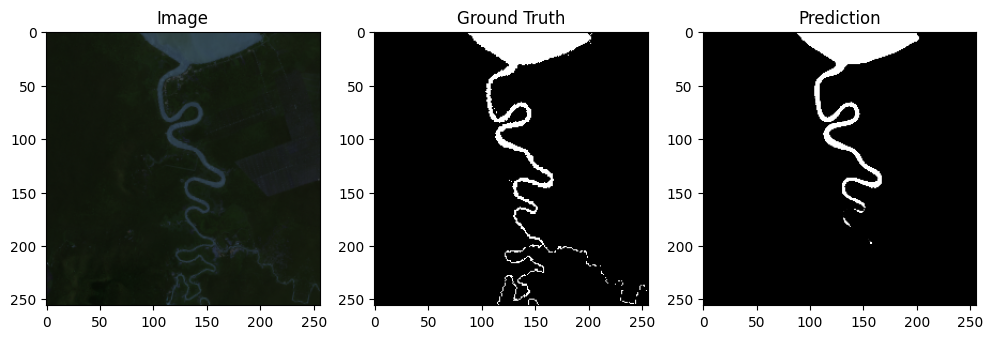

Validation IoU Score: 0.8060081180673763
Saved best model with IoU score: 0.8060081180673763
Epoch 24, Loss: 0.6297611594200134


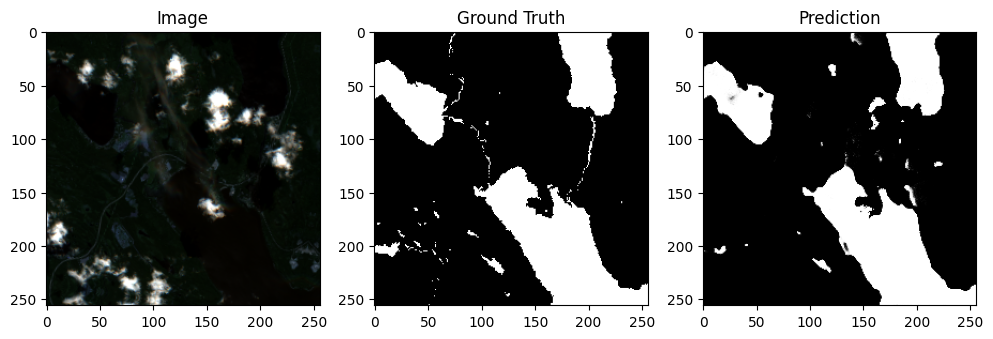

Validation IoU Score: 0.8068693229358257
Saved best model with IoU score: 0.8068693229358257
Epoch 25, Loss: 0.6292693316936493


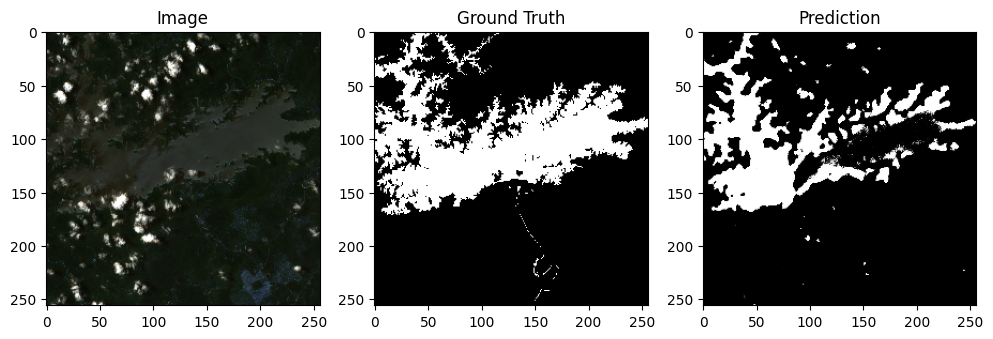

Validation IoU Score: 0.8092443998816711
Saved best model with IoU score: 0.8092443998816711
Epoch 26, Loss: 0.6289342045783997


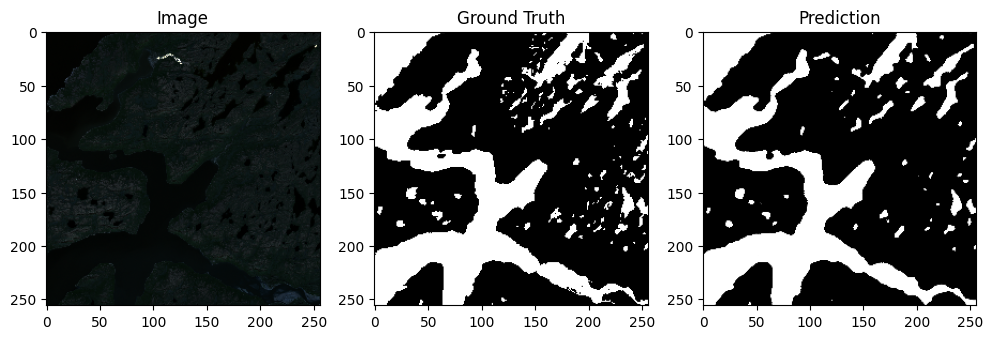

Validation IoU Score: 0.8115931258018396
Saved best model with IoU score: 0.8115931258018396
Epoch 27, Loss: 0.6297718286514282


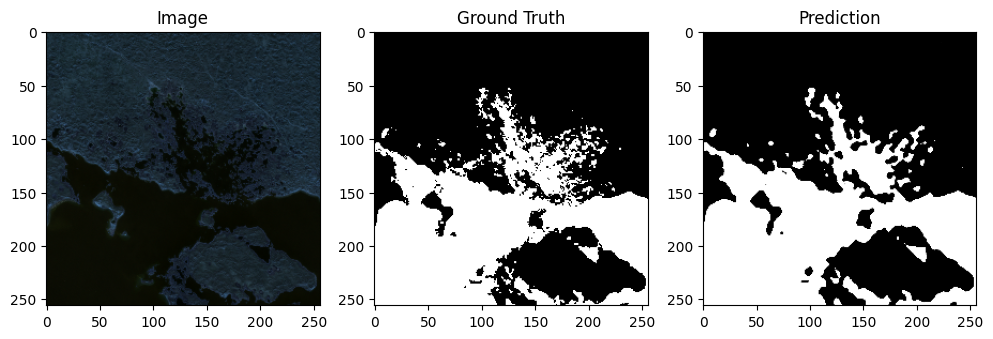

Validation IoU Score: 0.809954023579913
Epoch 28, Loss: 0.6291492581367493


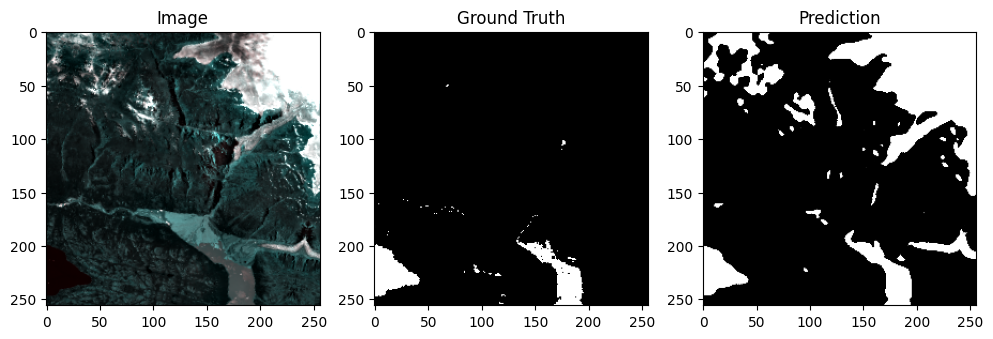

Validation IoU Score: 0.8119794601154967
Saved best model with IoU score: 0.8119794601154967
Epoch 29, Loss: 0.6295106410980225


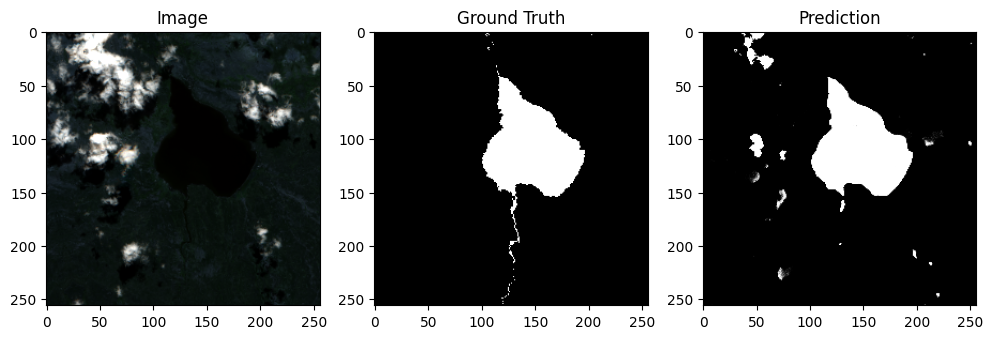

Validation IoU Score: 0.8123639933816685
Saved best model with IoU score: 0.8123639933816685
Epoch 30, Loss: 0.6289460957050323


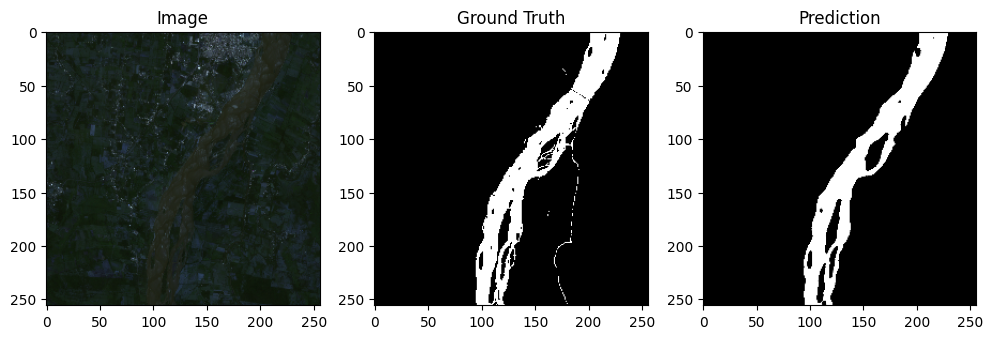

Validation IoU Score: 0.8079300449539549
Epoch 31, Loss: 0.6281432807445526


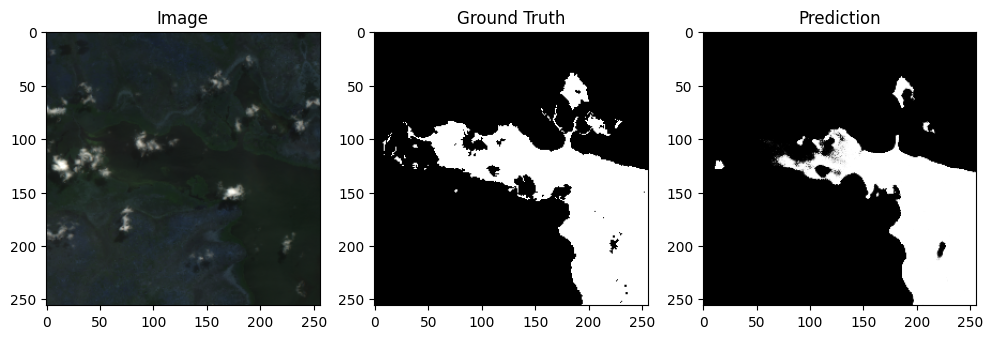

Validation IoU Score: 0.8107950141904655
Epoch 32, Loss: 0.6280049085617065


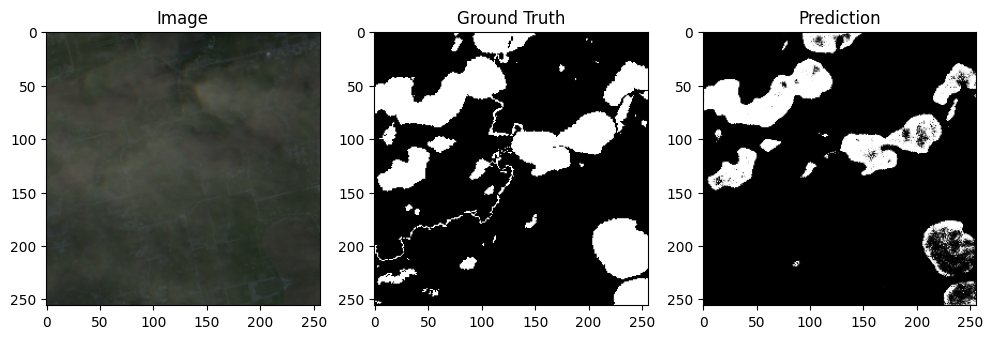

Validation IoU Score: 0.8138713458509277
Saved best model with IoU score: 0.8138713458509277
Epoch 33, Loss: 0.627962201833725


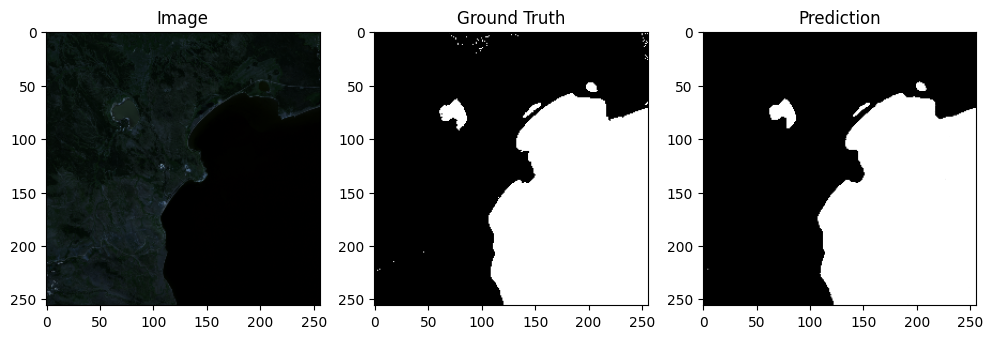

Validation IoU Score: 0.8153272705983373
Saved best model with IoU score: 0.8153272705983373
Epoch 34, Loss: 0.6286514401435852


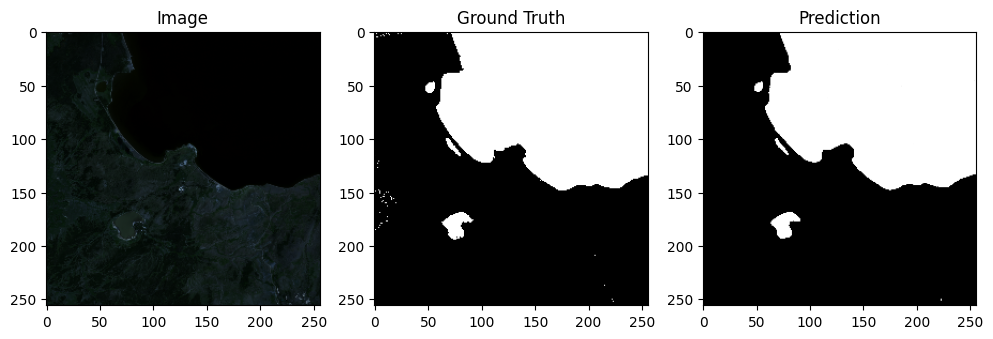

Validation IoU Score: 0.8153154785970881
Epoch 35, Loss: 0.6285468339920044


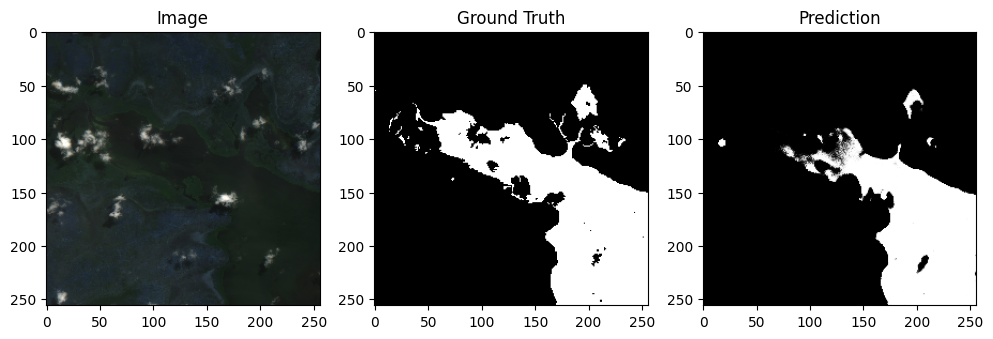

Validation IoU Score: 0.815204438281197
Epoch 36, Loss: 0.6282519400119781


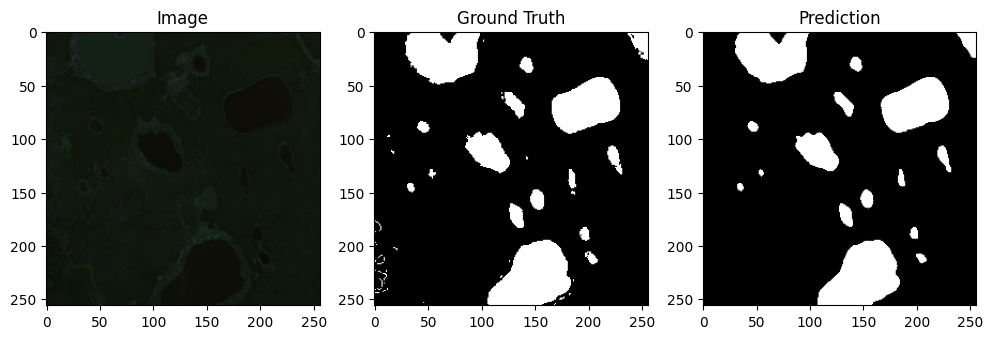

Validation IoU Score: 0.8147171300568075
Epoch 37, Loss: 0.6279871165752411


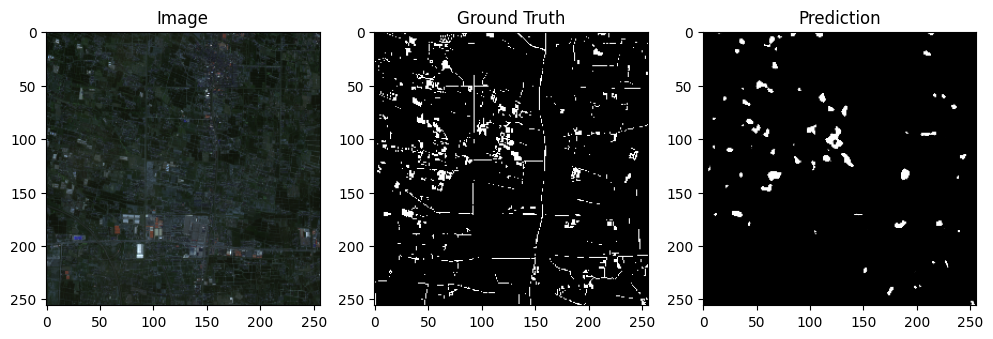

Validation IoU Score: 0.8138008845230605
Epoch 38, Loss: 0.6282881796360016


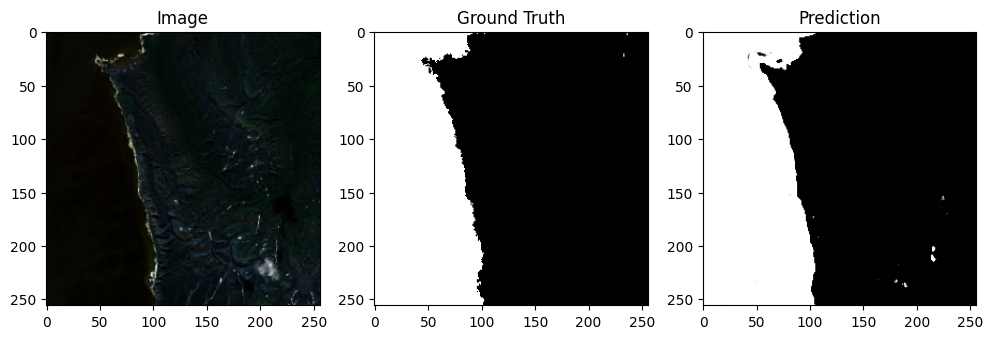

Validation IoU Score: 0.8135934090107901
Epoch 39, Loss: 0.628413051366806


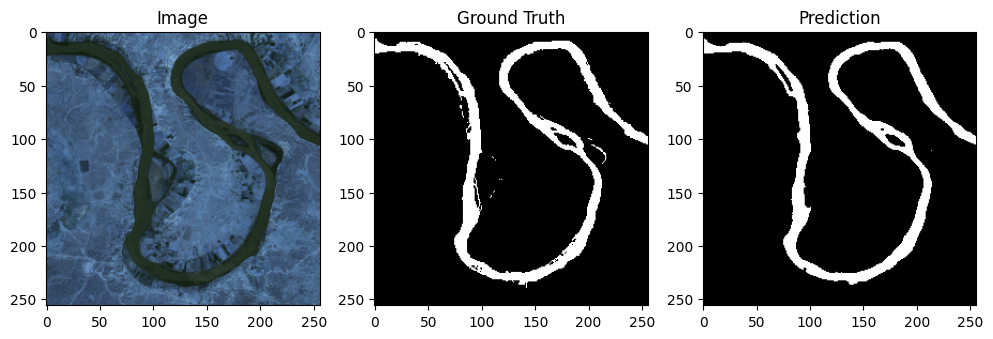

Validation IoU Score: 0.8134515014518322
Epoch 40, Loss: 0.6274151802062988


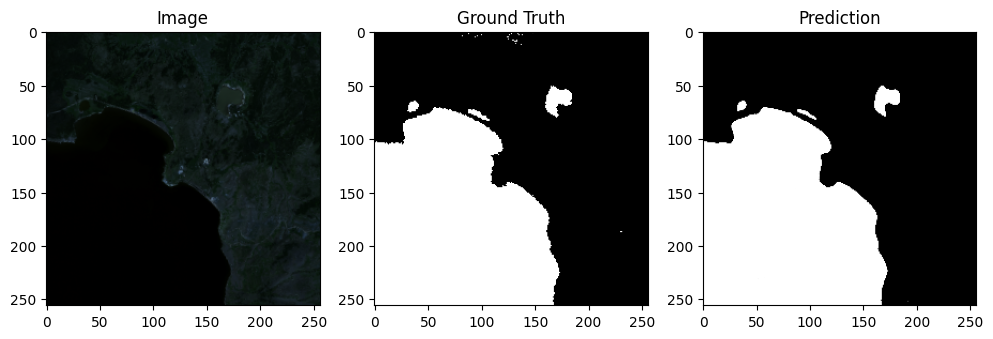

Validation IoU Score: 0.8143947832074364
Epoch 41, Loss: 0.6283274292945862


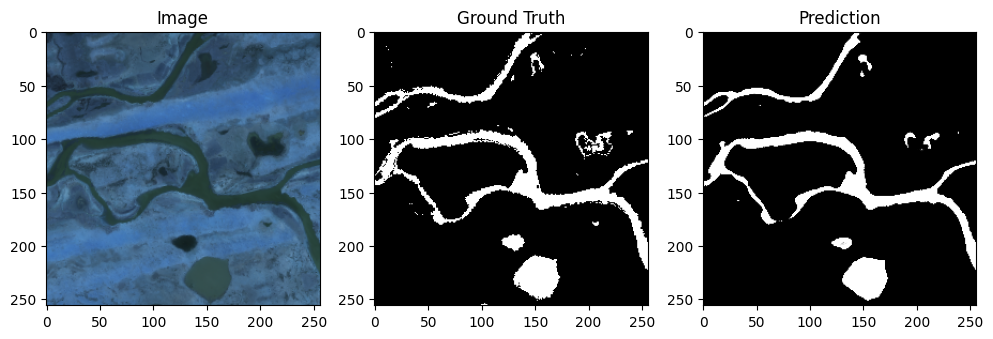

Validation IoU Score: 0.8159618407882491
Saved best model with IoU score: 0.8159618407882491
Epoch 42, Loss: 0.6281434893608093


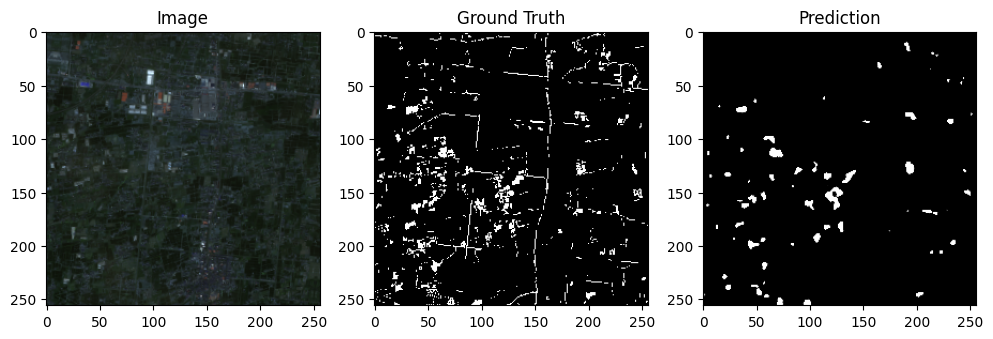

Validation IoU Score: 0.8164106167850984
Saved best model with IoU score: 0.8164106167850984
Epoch 43, Loss: 0.6276693046092987


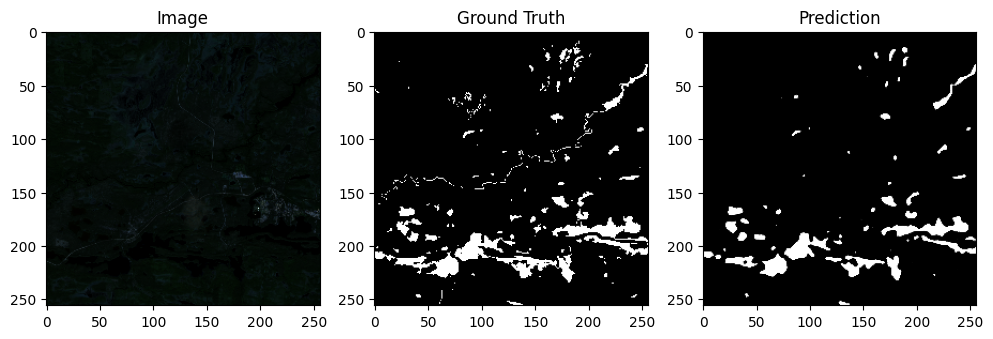

Validation IoU Score: 0.8169197677914749
Saved best model with IoU score: 0.8169197677914749
Epoch 44, Loss: 0.6277423799037933


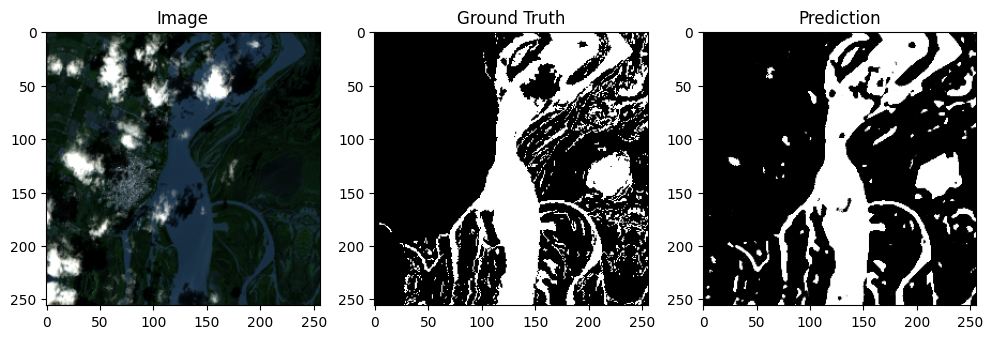

Validation IoU Score: 0.8160592848183569
Epoch 45, Loss: 0.6279915869235992


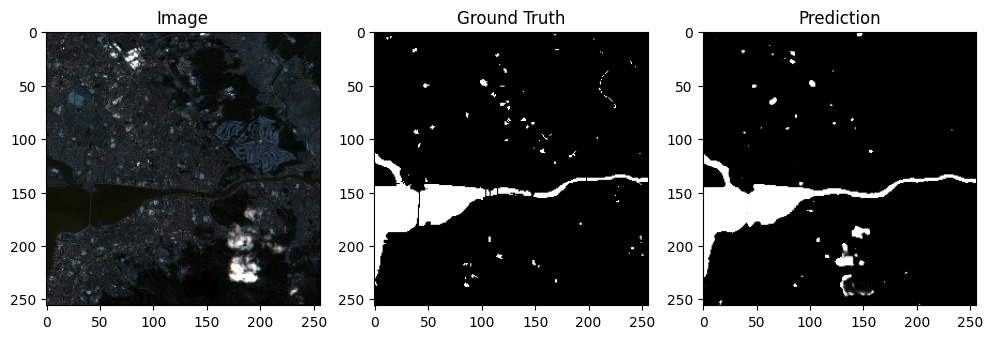

Validation IoU Score: 0.816774000520817
Epoch 46, Loss: 0.6273244619369507


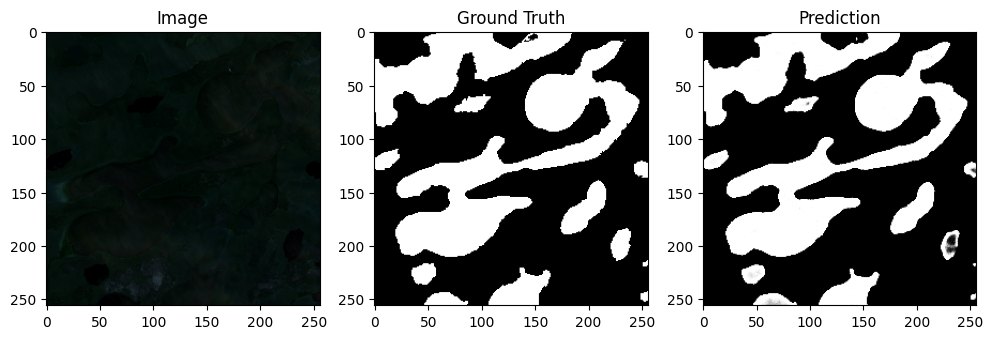

Validation IoU Score: 0.8160922399646932
Epoch 47, Loss: 0.6277861893177032


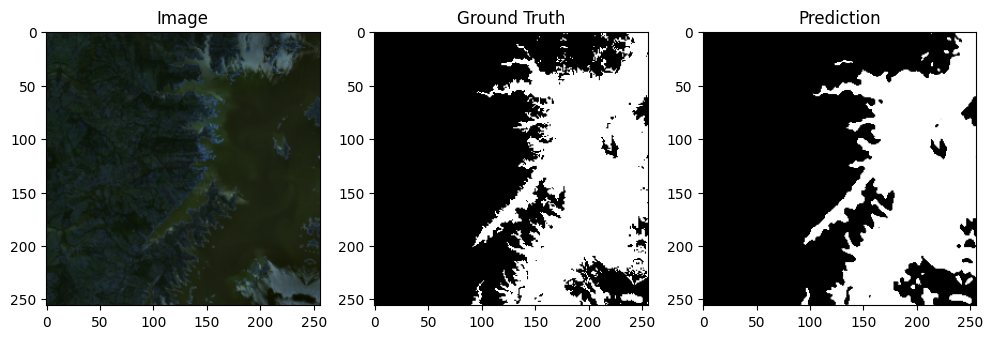

Validation IoU Score: 0.8163318547034075
Epoch 48, Loss: 0.6276907324790955


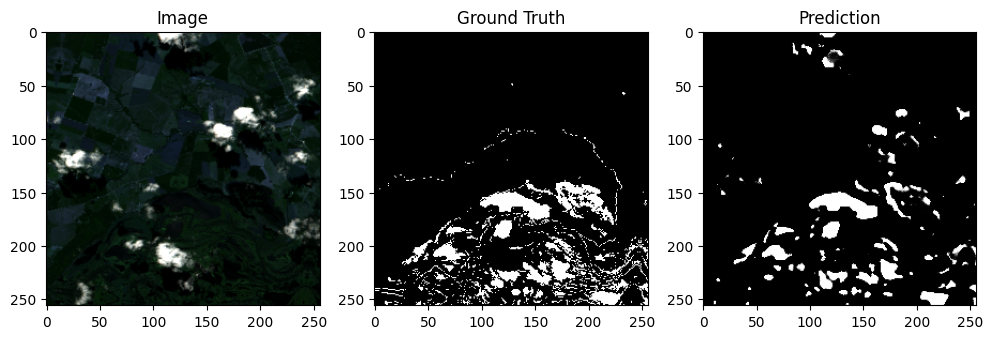

Validation IoU Score: 0.8160620998377714
Epoch 49, Loss: 0.6275546848773956


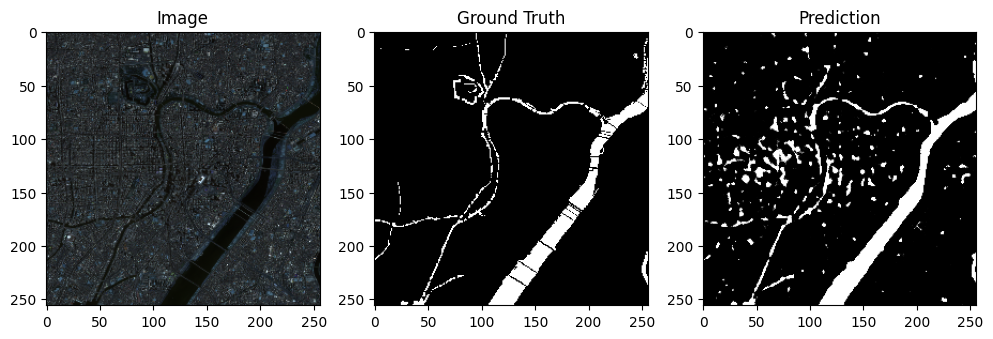

Validation IoU Score: 0.816250032242493
Epoch 50, Loss: 0.6270907521247864


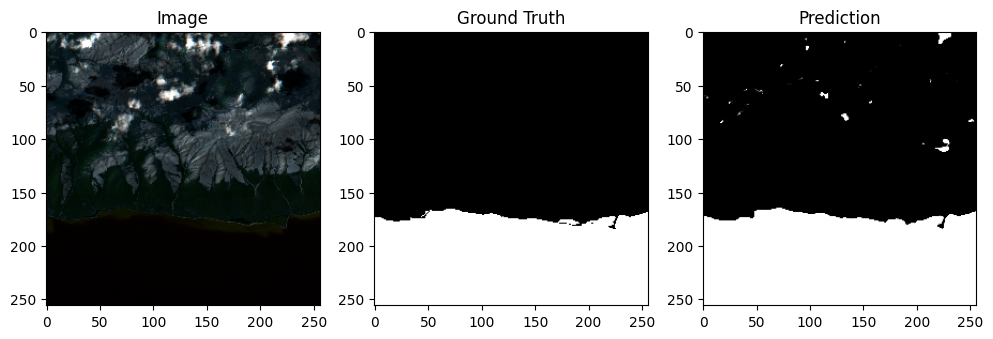

Validation IoU Score: 0.817464373745953
Saved best model with IoU score: 0.817464373745953


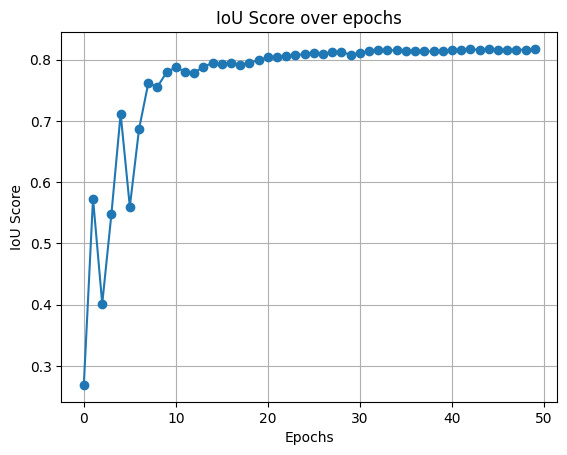

In [12]:
from torch.utils.data import DataLoader
from torch.nn import BCEWithLogitsLoss
from torch.optim import Adam
from sklearn.metrics import jaccard_score
from torch.optim.lr_scheduler import StepLR
import numpy as np


# 创建模型、损失函数和优化器
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(in_channels=6, out_channels=1).to(device)# 1个输出通道，表示二元分割
# model = DeepLabV3(in_channels=6, num_classes=1).to(device)
criterion = BCEWithLogitsLoss()

# 初始化优化器和学习率调度器
optimizer = Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = StepLR(optimizer, step_size=30, gamma=0.1)  # 每30个epochs降低学习率


# 训练循环
best_iou_score = 0.0
iou_scores = []
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch in train_loader:
        inputs = batch['scene'].to(device)
        labels = batch['truth'].to(device).float()
        inputs = inputs.permute(0, 3, 1, 2)
        optimizer.zero_grad()
        outputs = model(inputs)
        labels = labels.unsqueeze(1)  # 添加一个额外的维度来匹配输出的维度
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    print(f'Epoch {epoch+1}, Loss: {epoch_loss}')
    visualize_batch(inputs, labels, torch.sigmoid(outputs).detach(), 0)
    # 验证循环
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for batch in valid_loader:
            inputs = batch['scene'].to(device)
            labels = batch['truth'].to(device).float()

            outputs = model(inputs)
            preds = torch.sigmoid(outputs).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())  # 确保将标签发送到CPU并转换为NumPy数组

    # 计算Jaccard得分 (IoU)
    all_preds = np.array(all_preds).reshape(-1)
    all_labels = np.array(all_labels).reshape(-1)
    iou_score = jaccard_score(all_labels, all_preds > 0.5)
    iou_scores.append(iou_score)
    print(f'Validation IoU Score: {iou_score}')
    # 保存最佳模型
    if iou_score > best_iou_score:
        best_iou_score = iou_score
        torch.save(model.state_dict(), 'best_model.pth')
        print(f'Saved best model with IoU score: {best_iou_score}')
    scheduler.step()

# 在训练循环结束后绘制IoU得分
plt.figure()
plt.plot(range(num_epochs), iou_scores, marker='o')
plt.title('IoU Score over epochs')
plt.xlabel('Epochs')
plt.ylabel('IoU Score')
plt.grid(True)
plt.savefig('iou_scores.png')  # 保存图像
plt.show()  # 显示图像

In [13]:
from albumentations import Normalize, Compose, Resize
import albumentations.pytorch as A
import rasterio
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
# 定义预处理函数
def preprocess_input(input_array):
    preprocess_transform = Compose([
        Resize(height=256, width=256, always_apply=True),
        Normalize(
            mean=(0.485, 0.456, 0.406, 0.485, 0.456, 0.406),
            std=(0.229, 0.224, 0.225, 0.229, 0.224, 0.225)
        ),
        A.ToTensorV2(),
    ])

    transformed = preprocess_transform(image=input_array)
    input_tensor = transformed["image"]
    input_tensor = input_tensor.unsqueeze(0)
    return input_tensor

# 加载模型
model = UNet(in_channels=6, out_channels=1)
model.eval()
model.load_state_dict(torch.load('best_model.pth'))

# 读取并预处理输入图像
with rasterio.open('/content/dset-s2/tra_scene/S2A_L2A_20190125_N0211_R034_6Bands_S1.tif') as src:
    meta = src.meta
    input_array = src.read().transpose((1, 2, 0))
    input_tensor = preprocess_input(input_array)

# 进行预测
with torch.no_grad():
    output = model(input_tensor)

# 将输出转换为numpy数组并应用阈值来获取二值图像
output_array = output.cpu().numpy().squeeze(0).squeeze(0)
pred_binary = (output_array > 0.5).astype('uint8')

# 更新元数据并保存二值图像
meta.update(dtype=rasterio.uint8, count=1)
with rasterio.open('output_image.tif', 'w', **meta) as dst:
    dst.write(pred_binary, 1)

